In [1]:
# Import necessary packages
import csv
import plotly.graph_objects as go
import matplotlib.pyplot as plt

In [2]:
# Test open ECG CSV and inspect data

# ECG file
file_ecg = 'C:/Users/Bruno Oliveira/Desktop/P1234567890_Tricúspide_ECG_2023-10-23;17-41-13.0260.csv'

# Open the CSV file in read mode
with open(file_ecg, 'r') as file:
    # Create a CSV reader object
    csv_reader = csv.reader(file)

    # Iterate through the rows and print them
    for row in csv_reader:
        print(row)

['Multiscope']
['Device=CardioSleeve:C19B']
['Cardiac_signal=ECG']
['Test_valve=TricÃºspide']
['Sampling_frequency=500Hz']
['Packages_size=125samples']
['Packages_frequency=4Hz']
['2023-10-23 17:41:13.0490', '1969', '1969', '1971', '1974', '1977', '1980', '1986', '1991', '1996', '2001', '2006', '2011', '2015', '2020', '2025', '2030', '2033', '2037', '2044', '2050', '2055', '2060', '2067', '2074', '2079', '2085', '2091', '2096', '2100', '2104', '2110', '2114', '2114', '2116', '2119', '2121', '2121', '2122', '2126', '2129', '2131', '2131', '2135', '2140', '2143', '2144', '2148', '2154', '2156', '2154', '2154', '2155', '2154', '2150', '2147', '2145', '2144', '2138', '2132', '2127', '2124', '2118', '2110', '2103', '2100', '2094', '2084', '2077', '2071', '2065', '2055', '2046', '2039', '2035', '2028', '2021', '2015', '2013', '2009', '2004', '2000', '1999', '1998', '1995', '1991', '1989', '1990', '1989', '1985', '1984', '1986', '1988', '1987', '1987', '1989', '1992', '1992', '1991', '1993', 

In [3]:
# Test open PCG CSV and inspect data

# PCG file
file_pcg = 'C:/Users/Bruno Oliveira/Desktop/P1234567890_NaN_STE_2023-10-23;17-41-13.0260.csv'

# Open the CSV file in read mode
with open(file_pcg, 'r') as file:
    # Create a CSV reader object
    csv_reader = csv.reader(file)

    # Iterate through the rows and print them
    for row in csv_reader:
        print(row)

['Multiscope']
['Device=CardioSleeve:C19B']
['Cardiac_signal=STE']
['Test_valve=NaN']
['Sampling_frequency=3000Hz']
['Packages_size=750samples']
['Packages_frequency=4Hz']
['2023-10-23 17:41:13.0840', '4095', '4095', '4095', '4095', '4018', '3686', '3195', '2762', '2425', '2175', '1975', '1810', '1669', '1577', '1581', '1679', '1837', '2023', '2199', '2345', '2448', '2492', '2478', '2400', '2247', '2034', '1791', '1552', '1335', '1122', '926', '771', '647', '577', '600', '711', '893', '1142', '1432', '1728', '1995', '2208', '2352', '2415', '2418', '2392', '2338', '2251', '2141', '1997', '1806', '1594', '1393', '1225', '1113', '1072', '1109', '1227', '1441', '1751', '2119', '2500', '2847', '3112', '3284', '3377', '3400', '3374', '3319', '3231', '3108', '2938', '2703', '2412', '2085', '1747', '1449', '1243', '1166', '1233', '1416', '1663', '1949', '2267', '2614', '2972', '3288', '3496', '3562', '3499', '3368', '3217', '3048', '2843', '2569', '2210', '1797', '1361', '943', '620', '441', '

In [4]:
# Open only the header

# Open the CSV file in read mode
with open(file_ecg, 'r') as file:
    # Create a CSV reader object
    csv_reader = csv.reader(file)

    # Initialize a row counter
    row_count = 0

    # Iterate through the rows and print them
    for row in csv_reader:
        print(row[0])
        row_count += 1

        # Break out of the loop after reading the first 7 rows
        if row_count >= 7:
            break

Multiscope
Device=CardioSleeve:C19B
Cardiac_signal=ECG
Test_valve=TricÃºspide
Sampling_frequency=500Hz
Packages_size=125samples
Packages_frequency=4Hz


In [5]:
# Open only the rows with ECG data and inspect lenght
ecg_data = []  # List to store ECG samples

with open(file_ecg, 'r') as file:
    csv_reader = csv.reader(file)

    for row in csv_reader:
        if row and row[0].startswith('2023'):
            ecg_data.extend([int(value) for value in row[1:]])

len(ecg_data)

24375

In [6]:
# Open only the rows with PCG data and inspect lenght
pcg_data = []  # List to store PCG samples

with open(file_pcg, 'r') as file:
    csv_reader = csv.reader(file)

    for row in csv_reader:
        if row and row[0].startswith('2023'):
            pcg_data.extend([int(value) for value in row[1:]])
            
len(pcg_data)

146250

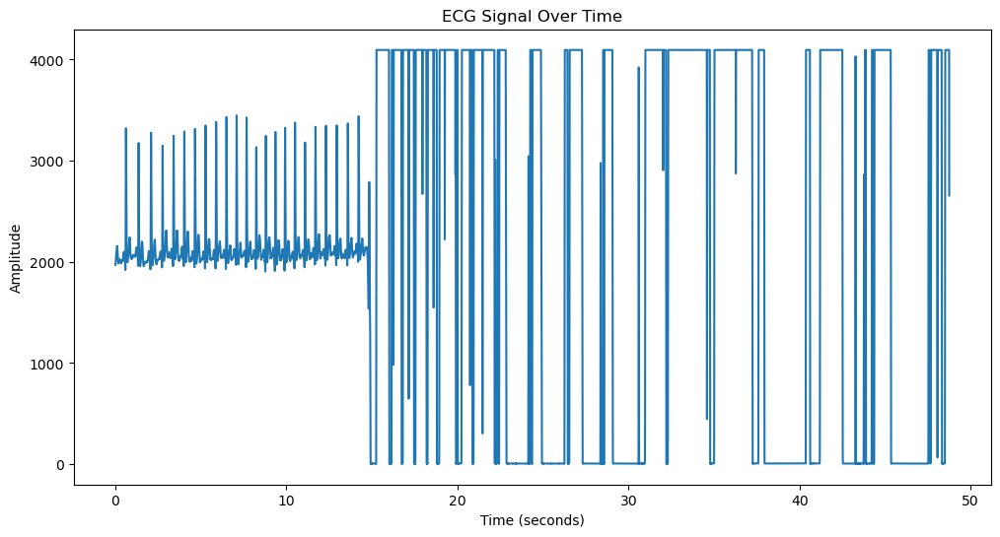

In [7]:
# Plot ECG data with matplotlib
sample_rate = 500  # Hz
time_step = 1 / sample_rate

# Create a list of timestamps for the ECG data
timestamps = [0]  # Initialize with the start time
for i in range(1, len(ecg_data)):
    timestamps.append(timestamps[-1] + time_step)
    
# Set the figure size before plotting
plt.figure(figsize=(12, 6))  # Adjust the numbers as needed for the desired size

# Plot the ECG signal
plt.plot(timestamps, ecg_data)
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.title('ECG Signal Over Time')
plt.show()

In [8]:
# Plot ECG data with plotly
sample_rate = 500  # Hz
time_step = 1 / sample_rate

# Create a list of timestamps for the ECG data
timestamps = [0]  # Initialize with the start time
for i in range(1, len(ecg_data)):
    timestamps.append(timestamps[-1] + time_step)

# Create a Plotly figure
fig = go.Figure()

# Add the ECG signal trace
fig.add_trace(go.Scatter(x=timestamps, y=ecg_data, mode='lines'))

# Customize the layout
fig.update_layout(
    title='ECG Signal Over Time',
    xaxis_title='Time (seconds)',
    yaxis_title='Amplitude',
)

# Show the interactive plot
fig.show()

# Final code

In [9]:
# Define function to plot ECG/PCG signal with plotly and show signal header 

def read_ecg_pcg_file(csv_file, sample_rate, signal_type):
    # Initialize a row counter
    row_count = 0

    # Iterate through the rows and print the first 7 rows
    with open(csv_file, 'r') as file:
        csv_reader = csv.reader(file)
        for row in csv_reader:
            print(row[0])
            row_count += 1
            if row_count >= 7:
                break

    data = []  # List to store ECG/PCG samples

    with open(csv_file, 'r') as file:
        csv_reader = csv.reader(file)

        for row in csv_reader:
            if row and row[0].startswith('2023'):
                data.extend([int(value) for value in row[1:]])

    time_step = 1 / sample_rate

    # Create a list of timestamps for the data
    timestamps = [0]  # Initialize with the start time
    for i in range(1, len(data)):
        timestamps.append(timestamps[-1] + time_step)
        
    # Calculate the signal duration in seconds
    signal_duration = (timestamps[-1] - timestamps[0])

    # Create a Plotly figure
    fig = go.Figure()

    # Add the signal trace
    fig.add_trace(go.Scatter(x=timestamps, y=data, mode='lines'))

    # Customize the layout
    fig.update_layout(
        title=f'{signal_type} Signal Over Time',
        xaxis_title='Time (seconds)',
        yaxis_title='Amplitude',
    )
    
    # Print the signal duration
    print(f'Signal Duration: {signal_duration:.2f} seconds')

    # Show the interactive plot
    fig.show()

In [10]:
# ECG example:
csv_file = 'C:/Users/Bruno Oliveira/Desktop/P1234567890_Tricúspide_ECG_2023-10-23;17-41-13.0260.csv'
sample_rate = 500
signal_type = 'ECG'
read_ecg_pcg_file(csv_file, sample_rate, signal_type)

Multiscope
Device=CardioSleeve:C19B
Cardiac_signal=ECG
Test_valve=TricÃºspide
Sampling_frequency=500Hz
Packages_size=125samples
Packages_frequency=4Hz
Signal Duration: 48.75 seconds


In [11]:
# PCG example:
csv_file = 'C:/Users/Bruno Oliveira/Desktop/P1234567890_NaN_STE_2023-10-23;17-41-13.0260.csv'
sample_rate = 3000
signal_type = 'PCG'
read_ecg_pcg_file(csv_file, sample_rate, signal_type)

Multiscope
Device=CardioSleeve:C19B
Cardiac_signal=STE
Test_valve=NaN
Sampling_frequency=3000Hz
Packages_size=750samples
Packages_frequency=4Hz
Signal Duration: 48.75 seconds
